In [1]:
from utils import *
import lime
from lime import lime_image
from skimage.segmentation import mark_boundaries
from matplotlib import cm
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.scores import CategoricalScore
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tensorflow.keras import backend as K
from tf_keras_vis.saliency import Saliency
from sklearn.metrics import confusion_matrix
from lime.wrappers.scikit_image import SegmentationAlgorithm
import matplotlib.pyplot as plt
import tensorflow as tf

In [2]:
# Read folder data images
root_dir = './images/'
img_files_paths = list()
class_labels = list()

for dir_, _, files in os.walk(root_dir):
    for file_name in files:
        if 'DS_Store' not in file_name:
            rel_dir = os.path.relpath(dir_, root_dir)
            class_labels.append(rel_dir)
            rel_file = os.path.join(rel_dir, file_name)
            rel_file = os.path.join(root_dir, rel_file)
            img_files_paths.append(rel_file.replace("\\", "/"))

In [3]:
# Read folder data images
root_dir1 = './unknown_DB865/'
root_dir2 = './unknown_DB866/'
img_files_paths_unknown = list()

for dir_, _, files in os.walk(root_dir1):
    for file_name in files:
        if 'DS_Store' not in file_name:
            #rel_dir = os.path.relpath(dir_, root_dir1)
            #rel_file = os.path.join(rel_dir, file_name)
            rel_file = os.path.join(root_dir1, file_name)
            img_files_paths_unknown.append(rel_file.replace("\\", "/"))
            
for dir_, _, files in os.walk(root_dir2):
    for file_name in files:
        if 'DS_Store' not in file_name:
            #rel_dir = os.path.relpath(dir_, root_dir2)
            #rel_file = os.path.join(rel_dir, file_name)
            rel_file = os.path.join(root_dir2, file_name)
            img_files_paths_unknown.append(rel_file.replace("\\", "/"))

In [4]:
class_type = 'pseudo-vs-all' #  all | pseudo-vs-all | genres
if class_type == 'pseudo-vs-all':
    class_labels = [l if l == 'pseudoracemus' else 'other' for l in class_labels]
elif class_type == 'genres':
    class_labels = [l if l != 'pseudoracemus' else 'racemus' for l in class_labels]
elif class_type == 'all':
    pass

In [5]:
################ PARAMETERS ################
hidden_vgg = 128
#hidden_comb = 64
dropout = True
#lr_coeff = 3
lr_coeff = 5
learning_rate = 10 / (10 ** lr_coeff)
reg = 'l2'

k_folds = 4
batch_size = 32
n_epochs = 20
n_steps = 5
n_classes = 2
num_struct = 6
rs = 42
num_replica = 1
cweights = 'yes' #no
############################################

In [6]:
# import structure list and reorder as img_files_paths
struct_df = pd.read_csv('./Categories.csv', sep = ';')
struct_unknown_df = pd.read_csv('./Categories_unknown.csv', sep = ';')
file_name_list = [path.split('/')[-1] for path in img_files_paths]
filename_df = pd.DataFrame(file_name_list)
filename_df['img_path'] = img_files_paths
filename_df['class'] = class_labels
filename_df.columns = ['filename', 'img_path', 'class']

full_ohe_df = pd.merge(filename_df, struct_df, on='filename')
file_name_list = [path.split('/')[-1] for path in img_files_paths_unknown]
filename_df = pd.DataFrame(file_name_list)
filename_df['img_path'] = img_files_paths_unknown
filename_df.columns = ['filename', 'img_path']

unknown_df = pd.merge(filename_df, struct_unknown_df, on='filename')
class_ohe = pd.get_dummies(full_ohe_df['class'])
full_ohe_df = pd.concat([full_ohe_df, class_ohe],axis=1)
full_ohe_df = full_ohe_df.drop(columns=['filename', 'trueclass', 'class'])
unknown_df = unknown_df.drop(columns=['filename', 'trueclass'])
for i in list(full_ohe_df.columns[-n_classes:]):
    unknown_df[i] = [0]*len(unknown_df)
full_df = full_ohe_df.append(unknown_df)
full_df

,img_path,conceptacles,perithallus,crystallites,epithallus,ipothallus,surface,other,pseudoracemus
0,./images/corallioides/13_03_031.jpg,0,0,0,1,0,0,1,0
1,./images/corallioides/14_01_005.jpg,0,0,1,0,0,0,1,0
2,./images/philippii/B1_D_35.jpg,0,0,0,0,1,0,1,0
3,./images/philippii/B3_B_84.jpg,1,0,0,0,0,0,1,0
4,./images/pseudoracemus/14052020_B3_A_129.jpg,0,0,1,0,0,0,0,1
5,./images/pseudoracemus/14052020_B3_B_153.jpg,0,0,0,0,0,1,0,1
6,./images/racemus/14052020_B1_A_04.jpg,1,0,0,0,0,0,1,0
7,./images/racemus/14052020_B1_A_16.jpg,0,0,1,0,0,0,1,0
8,./images/racemus/14052020_B1_A_31.jpg,0,0,0,0,0,0,1,0
9,./images/racemus/14052020_B1_A_39.jpg,0,0,0,0,0,0,1,0


In [8]:
save_dir = './models/FINAL_class-{}+struct_hn-{}_epochs-{}_lr-{}_{}_3rep/'.format(n_classes, hidden_vgg, n_epochs, lr_coeff, cweights)

loaded_models = []
test_dfs = []
train_dfs = []
predicts = []
predicts_train = []

xs = []

# load json and create model
json_file = open(save_dir + 'model.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
loaded_model = model_from_json(loaded_model_json)

# load weights into new model
loaded_model.load_weights(save_dir +"model.h5")
print("Loaded model from disk")

test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input, rescale=1./255)
unknown_generator = test_datagen.flow_from_dataframe(full_df, x_col='img_path', 
                                                  y_col=full_df.columns[1:].tolist(),
                                                  target_size = (224, 224),
                                                  class_mode ='raw',
                                                  batch_size = 1,
                                                  shuffle = False) 

unknown_generator.reset()
unknown_prob = loaded_model.predict_generator(own_test_generator_func(full_df, unknown_generator, num_struct, n_classes), 
                                           steps=full_df.shape[0])

Loaded model from disk
Found 14 validated image filenames.


C:\Users\cecil\AppData\Roaming\Python\Python38\site-packages\tensorflow\python\keras\engine\training.py:1905: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Loaded model from disk
Found 1 validated image filenames.


  0%|          | 0/100 [00:00<?, ?it/s]

Found 1 validated image filenames.


  0%|          | 0/100 [00:00<?, ?it/s]

Found 1 validated image filenames.


  0%|          | 0/100 [00:00<?, ?it/s]

Found 1 validated image filenames.


  0%|          | 0/100 [00:00<?, ?it/s]

Found 1 validated image filenames.


  0%|          | 0/100 [00:00<?, ?it/s]

Found 1 validated image filenames.


  0%|          | 0/100 [00:00<?, ?it/s]

Found 1 validated image filenames.


  0%|          | 0/100 [00:00<?, ?it/s]

Found 1 validated image filenames.


  0%|          | 0/100 [00:00<?, ?it/s]

Found 1 validated image filenames.


  0%|          | 0/100 [00:00<?, ?it/s]

Found 1 validated image filenames.


  0%|          | 0/100 [00:00<?, ?it/s]

Found 1 validated image filenames.


  0%|          | 0/100 [00:00<?, ?it/s]

Found 1 validated image filenames.


  0%|          | 0/100 [00:00<?, ?it/s]

Found 1 validated image filenames.


  0%|          | 0/100 [00:00<?, ?it/s]

Found 1 validated image filenames.


  0%|          | 0/100 [00:00<?, ?it/s]

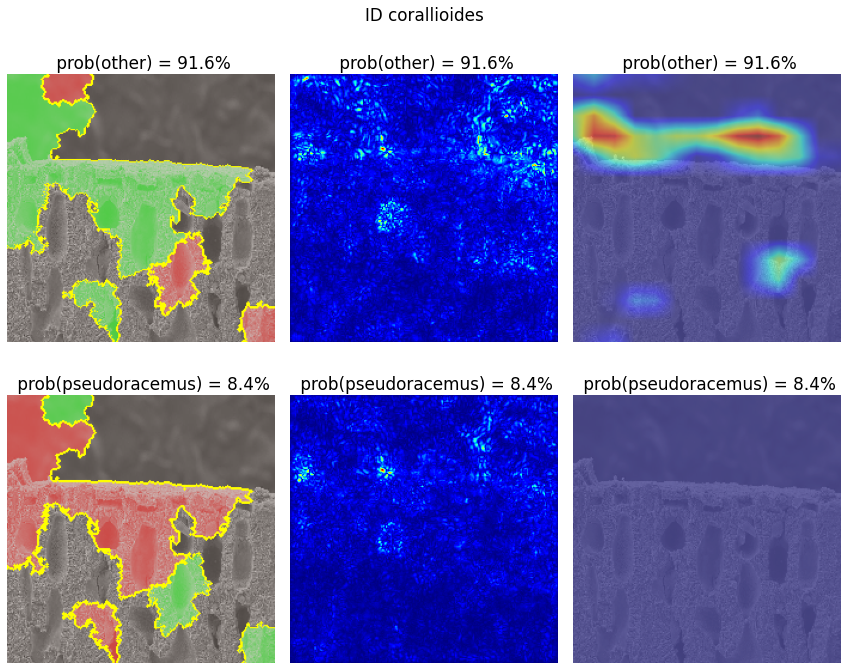

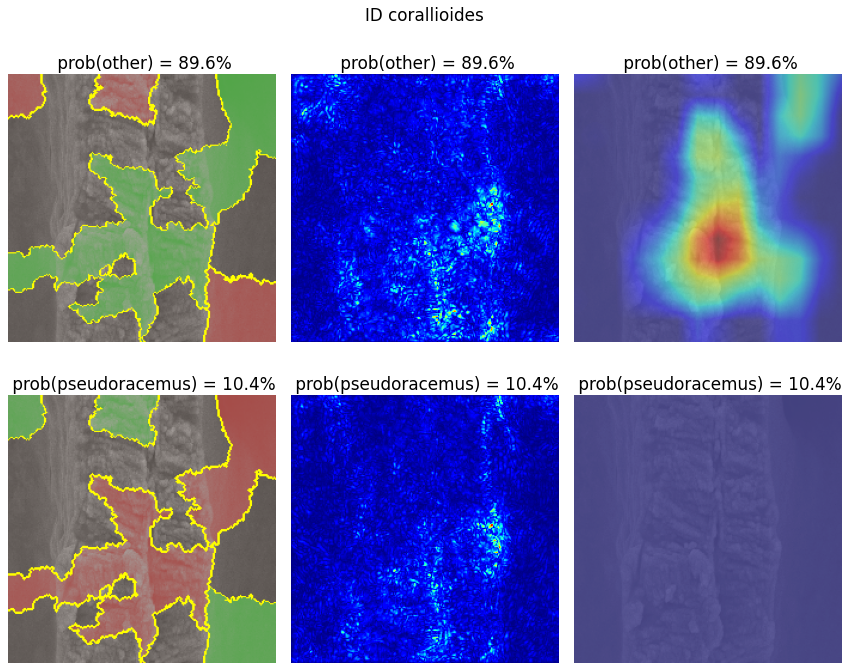

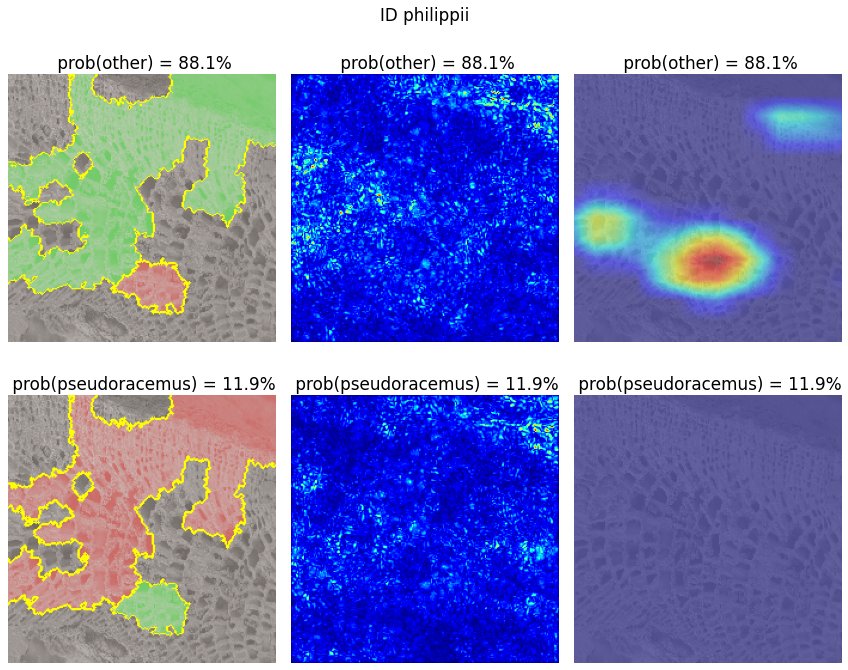

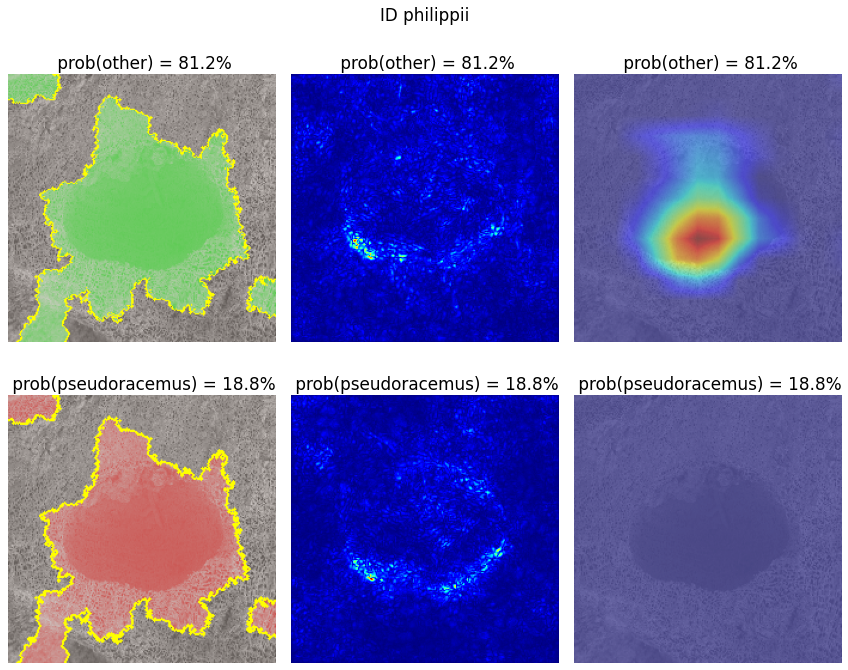

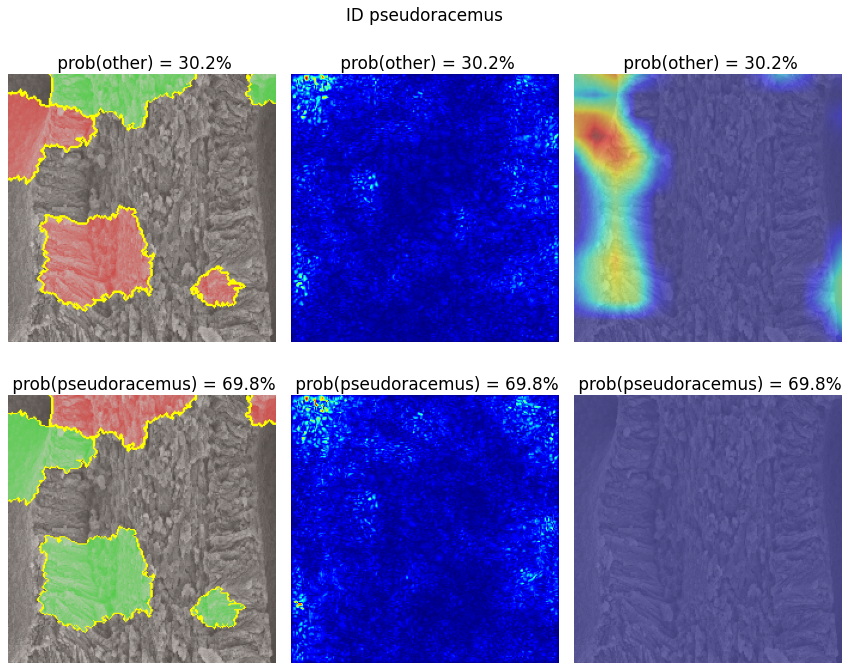

...

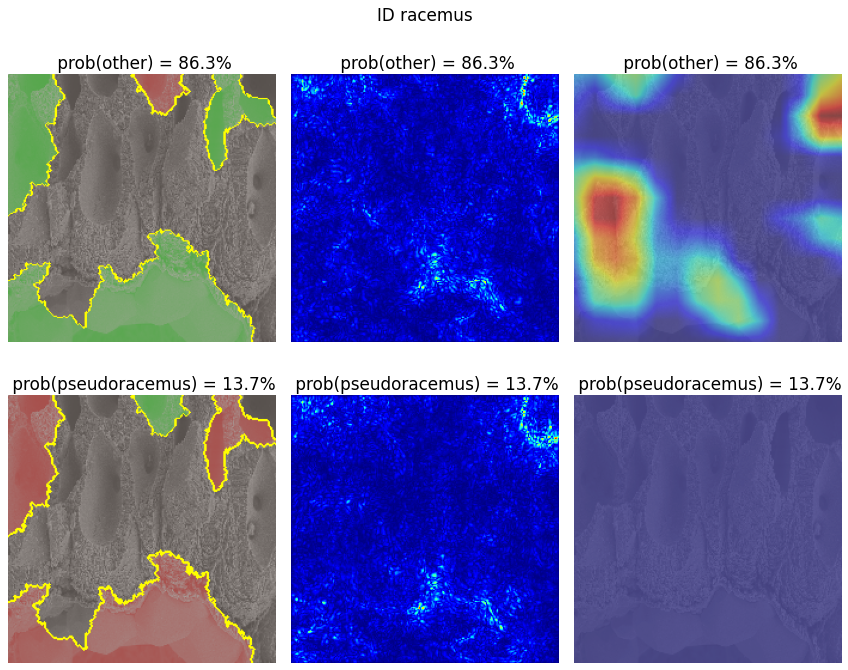

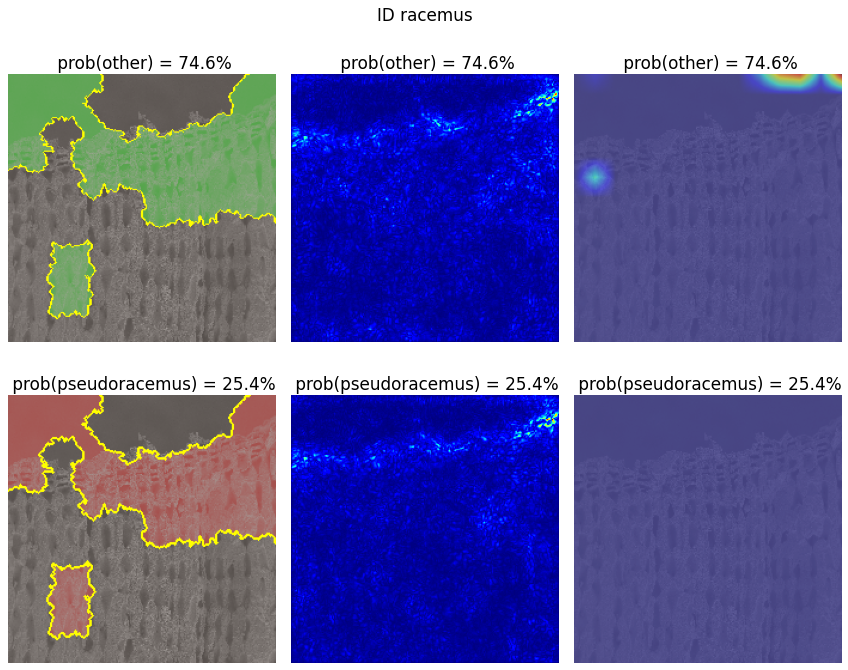

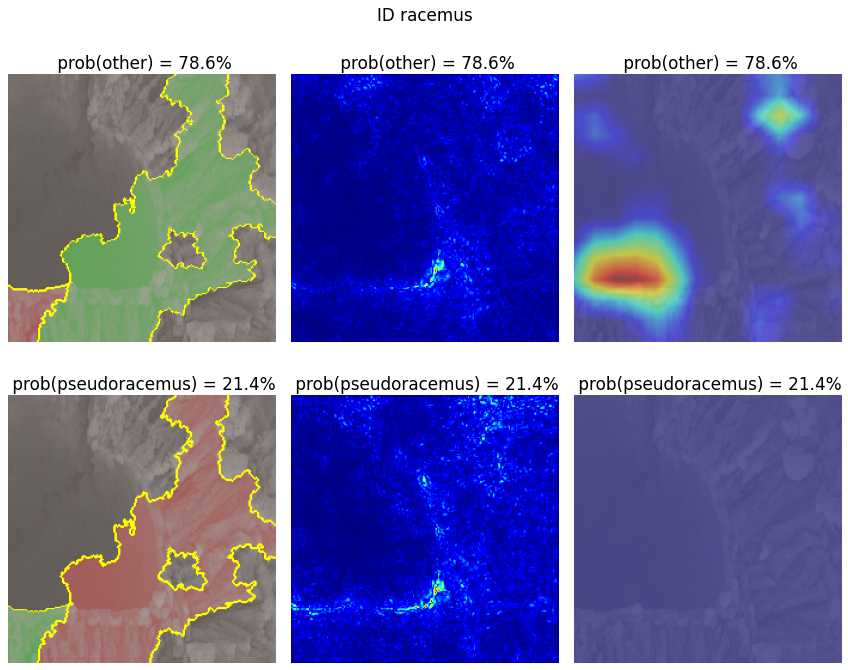

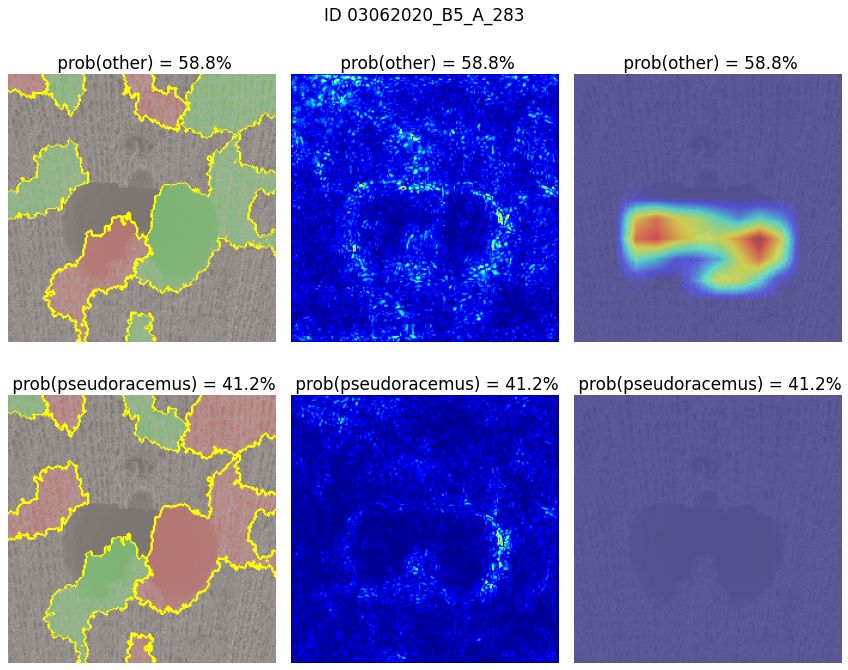

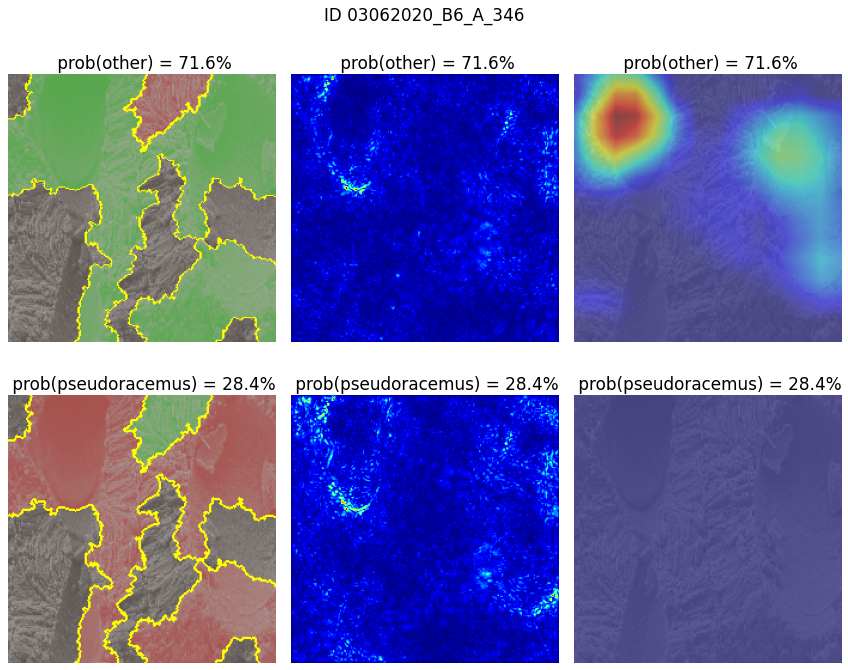

In [11]:
plt.rcParams.update({'font.size':14})
save_dir = './models/FINAL_class-{}+struct_hn-{}_epochs-{}_lr-{}_{}_3rep/'.format(n_classes, hidden_vgg, n_epochs, lr_coeff, cweights)

xs = []

# load json and create model
json_file = open(save_dir + 'model.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
loaded_model = model_from_json(loaded_model_json)

# load weights into new model
loaded_model.load_weights(save_dir +"model.h5")
print("Loaded model from disk")

for ff in range(len(full_df)):
    
    unknown_dff = pd.DataFrame(full_df.iloc[ff,:]).T
    unknown_datagen = ImageDataGenerator(preprocessing_function=preprocess_input, rescale=1./255)
    unknown_generator =unknown_datagen.flow_from_dataframe(unknown_dff, x_col='img_path', 
                                                      y_col=unknown_dff.columns[1:].tolist(),
                                                      target_size = (224, 224),
                                                      class_mode ='raw',
                                                      batch_size = 1,
                                                      shuffle = False) 

    unknown_generator.reset()
    data = unknown_generator.next()
    imgs = data[0]
    meta = data[1][:,:num_struct]
    targets = data[1][:,-1*n_classes:]
    n_samples = 100


    def get_classifier_fn(ximgs):
        return loaded_model.predict([ximgs.astype('float32'), meta.astype('float32')])

    #test_prob = loaded_model.predict([imgs.astype('float32'), meta.astype('float32')])
    #with open(save_dir + 'cv{}_test-prob.pickle'.format(cvnum), 'rb') as handle:
    #    test_prob = pickle.load(handle)

    fig, axs = plt.subplots(n_classes, 3, figsize = (12,10))
    fig.suptitle("ID "+full_df.iloc[ff,0].split("/")[2].split(".")[0])
    #row, colums = n_classes, 3
    ################
    #LIME
    explainer = lime_image.LimeImageExplainer()
    #ximgs = imgs[0].astype('double')
    explanation = explainer.explain_instance(imgs[0].astype('double'), 
                                         get_classifier_fn, 
                                         top_labels=n_classes, 
                                         hide_color=None,
                                         batch_size=1,
                                         num_samples=n_samples)

    #SALIENCY
    replace2linear = ReplaceToLinear()
    xstensor = tf.convert_to_tensor(imgs[0], dtype=tf.float32)
    metatensor = tf.convert_to_tensor(meta.reshape((1,6)), dtype=tf.float32)
    # Create Saliency object.
    saliency = Saliency(loaded_model,
                        model_modifier=replace2linear,
                        clone=True)

    #GRADCAM
    #create submodel (no meta info)
    sub_model = tf.keras.Sequential()
    for layer in loaded_model.layers[:20]:
        sub_model.add(layer)
    example_input_shape = (1, 224, 224, 3)
    sub_model.build(example_input_shape)
    gradcam = Gradcam(sub_model,
              model_modifier=replace2linear,
              clone=True)
    

    for i in range(n_classes):
        #LIME
        #plt.subplot(row, colums, cnt)
        axs[i,0].set_title(" prob("+full_df.columns[7+i]+") = "+ str(round(unknown_prob[ff][i]*100,1))+"%")
        temp, mask = explanation.get_image_and_mask(explanation.top_labels[i], 
                                                    negative_only=False, 
                                                    positive_only=False, 
                                                    num_features=10, 
                                                    hide_rest=False)
        axs[i,0].imshow(mark_boundaries(temp / 2 + 0.5, mask))
        axs[i,0].axis('off')


        #SALIENCY
        score = CategoricalScore(i)
        saliency_map = saliency(score, [xstensor, metatensor])
        axs[i,1].set_title(" prob("+full_df.columns[7+i]+") = "+ str(round(unknown_prob[ff][i]*100,1))+"%")
        #plt.subplot(row, colums, cnt)
        axs[i,1].imshow(saliency_map[0].reshape(224,224), cmap='jet')
        #axs[i,1].colorbar();
        axs[i,1].axis('off')

        #GRADCAM
        score = CategoricalScore(i)
        cam = gradcam(score, xstensor, penultimate_layer=-1)
        axs[i,2].set_title(" prob("+full_df.columns[7+i]+") = "+ str(round(unknown_prob[ff][i]*100,1))+"%")
        heatmap = np.uint8(cm.jet(cam.reshape(224,224))[..., :3] * 255)
        axs[i,2].imshow(imgs[0].astype('double').reshape(224,224,3) / 2 + 0.5, alpha=0.7)
        axs[i,2].imshow(heatmap, cmap='jet', alpha=0.5) # overlay
        #axs[i,2].colorbar();
        axs[i,2].axis('off')
        ##################
    #plt.axis('off')
    plt.tight_layout()
    #plt.savefig(save_dir+"/figs/"+unknown_df.iloc[ff,0].split("/")[2].split(".")[0]+".jpeg", dpi = 600)